In [101]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import re as re


In [102]:
# import data
df = pd.read_csv(r"C:\Users\Usuario\Desktop\Proyectos\Datos\movies\movies.csv")

df.head()




,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [103]:
# check missing data
          
for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, pct_missing))

name - 0.0%
rating - 0.010041731872717789%
genre - 0.0%
year - 0.0%
released - 0.0002608242044861763%
score - 0.0003912363067292645%
votes - 0.0003912363067292645%
director - 0.0%
writer - 0.0003912363067292645%
star - 0.00013041210224308815%
country - 0.0003912363067292645%
budget - 0.2831246739697444%
gross - 0.02464788732394366%
company - 0.002217005738132499%
runtime - 0.0005216484089723526%


In [104]:
# check data types
df.dtypes


name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget      float64
gross       float64
company      object
runtime     float64
dtype: object

In [105]:
df = df.dropna(subset = ['budget','gross','runtime','released'])
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [106]:
# remove .0 by changing data type
df['budget'] = df['budget'].astype('int64')
df['gross'] = df['gross'].astype('int64')
df['runtime'] = df['runtime'].astype('int64')
df['released'] = df['released'].astype('string')
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98


In [95]:
# separate released column into columns
new = df['released']
new.head()

KeyError: 'released'

In [40]:
# replace unnecesary characters
new = new.str.replace(',',' ')
new = new.str.replace('\(',' ')
new = new.str.replace('\)',' ')
new.head()

C:\Users\Usuario\AppData\Local\Temp\ipykernel_4016\1230256764.py:3: FutureWarning: The default value of regex will change from True to False in a future version.
  new = new.str.replace('\(',' ')
C:\Users\Usuario\AppData\Local\Temp\ipykernel_4016\1230256764.py:4: FutureWarning: The default value of regex will change from True to False in a future version.
  new = new.str.replace('\)',' ')


0           June 13  1980  United States 
1            July 2  1980  United States 
2           June 20  1980  United States 
3            July 2  1980  United States 
4           July 25  1980  United States 
                      ...                
7648     January 17  2020  United States 
7649    February 14  2020  United States 
7650     January 17  2020  United States 
7651    February 21  2020  United States 
7652      August 28  2020  United States 
Name: released, Length: 5435, dtype: string

In [41]:
# get new columns
new = new.str.split('  ',expand=True)
new.head()

,0,1,2
0,June 13,1980,United States
1,July 2,1980,United States
2,June 20,1980,United States
3,July 2,1980,United States
4,July 25,1980,United States
...,...,...,...
7648,January 17,2020,United States
7649,February 14,2020,United States
7650,January 17,2020,United States
7651,February 21,2020,United States


In [42]:
# insert new columns and drop old column
df['released_day'] = new[0]
df['released_year'] = new[1]
df['released_country'] = new[2]
df = df.drop(columns=['released'])
df.head()



,name,rating,genre,year,score,votes,director,writer,star,country,budget,gross,company,runtime,released_day,released_year,released_country
0,The Shining,R,Drama,1980,8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146,June 13,1980,United States
1,The Blue Lagoon,R,Adventure,1980,5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104,July 2,1980,United States
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124,June 20,1980,United States
3,Airplane!,PG,Comedy,1980,7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88,July 2,1980,United States
4,Caddyshack,R,Comedy,1980,7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98,July 25,1980,United States
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7648,Bad Boys for Life,R,Action,2020,6.6,140000.0,Adil El Arbi,Peter Craig,Will Smith,United States,90000000,426505244,Columbia Pictures,124,January 17,2020,United States
7649,Sonic the Hedgehog,PG,Action,2020,6.5,102000.0,Jeff Fowler,Pat Casey,Ben Schwartz,United States,85000000,319715683,Paramount Pictures,99,February 14,2020,United States
7650,Dolittle,PG,Adventure,2020,5.6,53000.0,Stephen Gaghan,Stephen Gaghan,Robert Downey Jr.,United States,175000000,245487753,Universal Pictures,101,January 17,2020,United States
7651,The Call of the Wild,PG,Adventure,2020,6.8,42000.0,Chris Sanders,Michael Green,Harrison Ford,Canada,135000000,111105497,20th Century Studios,100,February 21,2020,United States


In [43]:
df.dtypes

name                 object
rating               object
genre                object
year                  int64
score               float64
votes               float64
director             object
writer               object
star                 object
country              object
budget                int64
gross                 int64
company              object
runtime               int64
released_day         string
released_year        string
released_country     string
dtype: object

In [107]:
df.sort_values(by=['gross'], inplace = False, ascending = False)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149
7480,The Lion King,PG,Animation,2019,"July 19, 2019 (United States)",6.9,222000.0,Jon Favreau,Jeff Nathanson,Donald Glover,United States,260000000,1670727580,Walt Disney Pictures,118
6653,Jurassic World,PG-13,Action,2015,"June 12, 2015 (United States)",7.0,593000.0,Colin Trevorrow,Rick Jaffa,Chris Pratt,United States,150000000,1670516444,Universal Pictures,124
6043,The Avengers,PG-13,Action,2012,"May 4, 2012 (United States)",8.0,1300000.0,Joss Whedon,Joss Whedon,Robert Downey Jr.,United States,220000000,1518815515,Marvel Studios,143
6646,Furious 7,PG-13,Action,2015,"April 3, 2015 (United States)",7.1,370000.0,James Wan,Chris Morgan,Vin Diesel,United States,190000000,1515341399,Universal Pictures,137
7494,Frozen II,PG,Animation,2019,"November 22, 2019 (United States)",6.8,148000.0,Chris Buck,Jennifer Lee,Kristen Bell,United States,150000000,1450026933,Walt Disney Animation Studios,103


In [91]:
pd.set_option('display.max_rows', None)
df.head()

,name,rating,genre,year,score,votes,director,writer,star,country,budget,gross,company,runtime,released_day,released_year,released_country
0,4705,6,6,1980,8.4,927000.0,1800,2840,700,46,19000000,46998772,1432,146,June 13,1980,United States
1,3942,6,1,1980,5.8,65000.0,1581,1160,215,47,4500000,58853106,454,104,July 2,1980,United States
2,3653,4,0,1980,8.7,1200000.0,759,1822,1161,47,18000000,538375067,949,124,June 20,1980,United States
3,205,4,4,1980,7.7,221000.0,891,1416,1478,47,3500000,83453539,1114,88,July 2,1980,United States
4,734,6,4,1980,7.3,108000.0,721,352,272,47,6000000,39846344,1089,98,July 25,1980,United States
5,1513,6,9,1980,6.4,123000.0,1763,3090,156,47,550000,39754601,1114,95,May 9,1980,United States
6,3943,6,0,1980,7.9,188000.0,976,578,861,47,27000000,115229890,1403,133,June 20,1980,United States
7,3133,6,3,1980,8.2,330000.0,1272,1259,1473,47,18000000,23402427,392,129,December 19,1980,United States
8,3744,4,0,1980,6.8,101000.0,1611,1405,596,47,54000000,108185706,550,127,June 19,1981,United States
9,4414,6,3,1980,7.0,10000.0,2017,281,403,47,10000000,15795189,1397,100,May 16,1980,United States


In [46]:
# drop duplicates
df = df.drop_duplicates()
df.head()

,name,rating,genre,year,score,votes,director,writer,star,country,budget,gross,company,runtime,released_day,released_year,released_country
0,The Shining,R,Drama,1980,8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146,June 13,1980,United States
1,The Blue Lagoon,R,Adventure,1980,5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104,July 2,1980,United States
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124,June 20,1980,United States
3,Airplane!,PG,Comedy,1980,7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88,July 2,1980,United States
4,Caddyshack,R,Comedy,1980,7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98,July 25,1980,United States
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7648,Bad Boys for Life,R,Action,2020,6.6,140000.0,Adil El Arbi,Peter Craig,Will Smith,United States,90000000,426505244,Columbia Pictures,124,January 17,2020,United States
7649,Sonic the Hedgehog,PG,Action,2020,6.5,102000.0,Jeff Fowler,Pat Casey,Ben Schwartz,United States,85000000,319715683,Paramount Pictures,99,February 14,2020,United States
7650,Dolittle,PG,Adventure,2020,5.6,53000.0,Stephen Gaghan,Stephen Gaghan,Robert Downey Jr.,United States,175000000,245487753,Universal Pictures,101,January 17,2020,United States
7651,The Call of the Wild,PG,Adventure,2020,6.8,42000.0,Chris Sanders,Michael Green,Harrison Ford,Canada,135000000,111105497,20th Century Studios,100,February 21,2020,United States


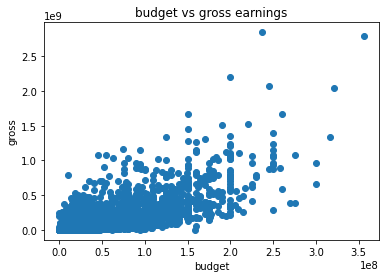

In [51]:
# check which variables are more correlated to 'gross'. Check 'budget','score','genre' probably have high correlation
# build scatterplot on 'budget' and 'score'

plt.scatter(x=df['budget'], y=df['gross'])
plt.title('budget vs gross earnings')
plt.xlabel('budget')
plt.ylabel('gross')
plt.show()






<AxesSubplot:xlabel='budget', ylabel='gross'>

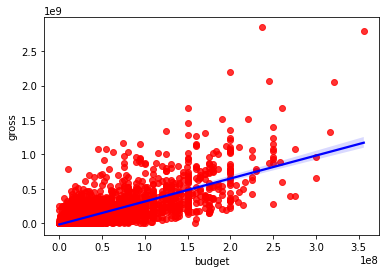

In [108]:
# regression plot using seaborn

sns.regplot(x='budget',y='gross',data=df,scatter_kws={"color":"red"},line_kws={"color":"blue"})

In [109]:
# since there is a correlation, it is possible to quantify it. Can be pearson, kendall, spearman
df.corr(method='pearson')

,year,score,votes,budget,gross,runtime
year,1.000000,0.055391,0.205852,0.327793,0.274354,0.074203
score,0.055391,1.000000,0.473789,0.071821,0.222100,0.414580
votes,0.205852,0.473789,1.000000,0.440035,0.614895,0.352437
budget,0.327793,0.071821,0.440035,1.000000,0.740410,0.318595
gross,0.274354,0.222100,0.614895,0.740410,1.000000,0.275596
runtime,0.074203,0.414580,0.352437,0.318595,0.275596,1.000000


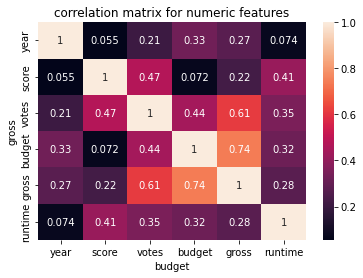

In [68]:
# there is a high correlation between 'budget' and 'gross'
correlation_matrix = df.corr(method='pearson')

sns.heatmap(correlation_matrix, annot=True)
plt.title('correlation matrix for numeric features')
plt.xlabel('features')
plt.ylabel('features')
plt.show()

In [73]:
# look at genre since it is not a numeric attribute
df_numerized = df
for col_name in df_numerized.columns:
    if(df_numerized[col_name].dtype == 'object'):
        df_numerized[col_name] = df_numerized[col_name].astype('category')
        df_numerized[col_name]= df_numerized[col_name].cat.codes
        
df_numerized


,name,rating,genre,year,score,votes,director,writer,star,country,budget,gross,company,runtime,released_day,released_year,released_country
0,4705,6,6,1980,8.4,927000.0,1800,2840,700,46,19000000,46998772,1432,146,June 13,1980,United States
1,3942,6,1,1980,5.8,65000.0,1581,1160,215,47,4500000,58853106,454,104,July 2,1980,United States
2,3653,4,0,1980,8.7,1200000.0,759,1822,1161,47,18000000,538375067,949,124,June 20,1980,United States
3,205,4,4,1980,7.7,221000.0,891,1416,1478,47,3500000,83453539,1114,88,July 2,1980,United States
4,734,6,4,1980,7.3,108000.0,721,352,272,47,6000000,39846344,1089,98,July 25,1980,United States
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7648,416,6,0,2020,6.6,140000.0,17,2397,1819,47,90000000,426505244,454,124,January 17,2020,United States
7649,3568,4,0,2020,6.5,102000.0,854,2316,148,47,85000000,319715683,1114,99,February 14,2020,United States
7650,1156,4,1,2020,5.6,53000.0,1814,2835,1474,47,175000000,245487753,1403,101,January 17,2020,United States
7651,3991,4,1,2020,6.8,42000.0,296,2096,641,6,135000000,111105497,12,100,February 21,2020,United States


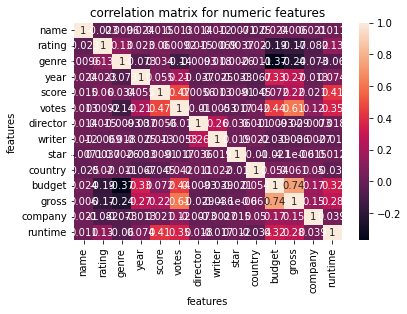

<Figure size 720x720 with 0 Axes>

In [82]:
correlation_matrix = df_numerized.corr(method='pearson')
sns.heatmap(correlation_matrix, annot=True)
plt.title('correlation matrix for numeric features')
plt.xlabel('features')
plt.ylabel('features')
plt.figure(figsize=(10,10))
plt.show()

In [83]:
df_numerized.corr()

,name,rating,genre,year,score,votes,director,writer,star,country,budget,gross,company,runtime
name,1.000000,-0.023011,0.009647,0.024418,0.014981,0.012923,0.013698,0.011576,-0.007111,-0.024563,0.023695,0.005973,0.021216,0.010801
rating,-0.023011,1.000000,0.128076,0.022705,0.059517,0.009241,0.014848,-0.006881,0.003740,0.020160,-0.186890,-0.168829,-0.082189,0.133239
genre,0.009647,0.128076,1.000000,-0.072815,0.033805,-0.136573,-0.009300,0.017790,0.002638,-0.010768,-0.368932,-0.244499,-0.073306,-0.060186
year,0.024418,0.022705,-0.072815,1.000000,0.055391,0.205852,-0.036942,-0.024794,-0.032788,-0.066730,0.327793,0.274354,-0.013061,0.074203
score,0.014981,0.059517,0.033805,0.055391,1.000000,0.473789,0.005577,0.013130,0.009139,-0.044624,0.071821,0.222100,0.021055,0.414580
votes,0.012923,0.009241,-0.136573,0.205852,0.473789,1.000000,-0.010196,-0.005301,-0.017134,0.042173,0.440035,0.614895,0.119367,0.352437
director,0.013698,0.014848,-0.009300,-0.036942,0.005577,-0.010196,1.000000,0.262973,0.036289,0.011107,-0.009341,-0.029365,-0.007337,0.018082
writer,0.011576,-0.006881,0.017790,-0.024794,0.013130,-0.005301,0.262973,1.000000,0.019255,0.022076,-0.039448,-0.035920,-0.002652,-0.016671
star,-0.007111,0.003740,0.002638,-0.032788,0.009139,-0.017134,0.036289,0.019255,1.000000,-0.010140,-0.021283,-0.000004,0.015087,0.012439
country,-0.024563,0.020160,-0.010768,-0.066730,-0.044624,0.042173,0.011107,0.022076,-0.010140,1.000000,0.054366,0.060952,0.049560,-0.033554


In [92]:
correlation_mat = df_numerized.corr()
corr_pairs = correlation_mat.unstack()
corr_pairs

name      name        1.000000
          rating     -0.023011
          genre       0.009647
          year        0.024418
          score       0.014981
          votes       0.012923
          director    0.013698
          writer      0.011576
          star       -0.007111
          country    -0.024563
          budget      0.023695
          gross       0.005973
          company     0.021216
          runtime     0.010801
rating    name       -0.023011
          rating      1.000000
          genre       0.128076
          year        0.022705
          score       0.059517
          votes       0.009241
          director    0.014848
          writer     -0.006881
          star        0.003740
          country     0.020160
          budget     -0.186890
          gross      -0.168829
          company    -0.082189
          runtime     0.133239
genre     name        0.009647
          rating      0.128076
          genre       1.000000
          year       -0.072815
        

In [93]:
# sort values
sorted_pairs = corr_pairs.sort_values()
sorted_pairs

genre     budget     -0.368932
budget    genre      -0.368932
gross     genre      -0.244499
genre     gross      -0.244499
budget    rating     -0.186890
rating    budget     -0.186890
gross     rating     -0.168829
rating    gross      -0.168829
genre     votes      -0.136573
votes     genre      -0.136573
rating    company    -0.082189
company   rating     -0.082189
          genre      -0.073306
genre     company    -0.073306
          year       -0.072815
year      genre      -0.072815
country   year       -0.066730
year      country    -0.066730
genre     runtime    -0.060186
runtime   genre      -0.060186
country   score      -0.044624
score     country    -0.044624
budget    writer     -0.039448
writer    budget     -0.039448
director  year       -0.036942
year      director   -0.036942
gross     writer     -0.035920
writer    gross      -0.035920
country   runtime    -0.033554
runtime   country    -0.033554
year      star       -0.032788
star      year       -0.032788
director

In [94]:
# can conclude that votes and budget have the highest correlation to gross earnings
high_corr = sorted_pairs[(sorted_pairs) > 0.5 ]
high_corr


votes     gross       0.614895
gross     votes       0.614895
budget    gross       0.740410
gross     budget      0.740410
name      name        1.000000
gross     gross       1.000000
budget    budget      1.000000
country   country     1.000000
star      star        1.000000
writer    writer      1.000000
director  director    1.000000
votes     votes       1.000000
score     score       1.000000
year      year        1.000000
genre     genre       1.000000
rating    rating      1.000000
company   company     1.000000
runtime   runtime     1.000000
dtype: float64